In [1]:
#Import Libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
#Load Image
img = cv2.imread('peppers.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

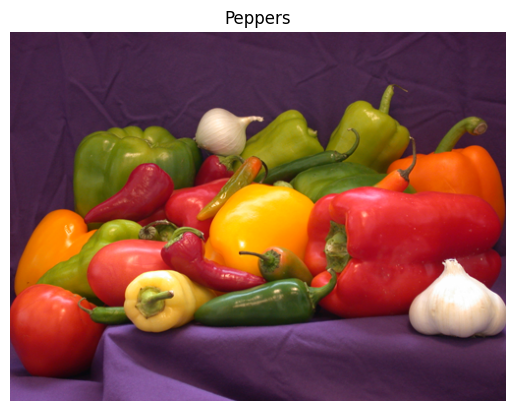

In [3]:
#Show Image
plt.imshow(img)
plt.title("Peppers")
plt.axis('off')
plt.show()


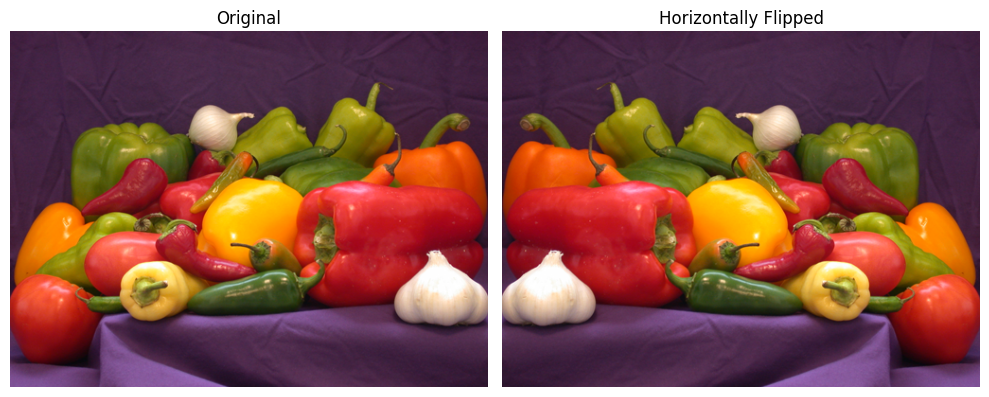

In [4]:
#Flip Horizontal Image
horiz = cv2.flip(img, 1)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Original")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(horiz)
plt.title("Horizontally Flipped")
plt.axis('off')

plt.tight_layout()
plt.show()



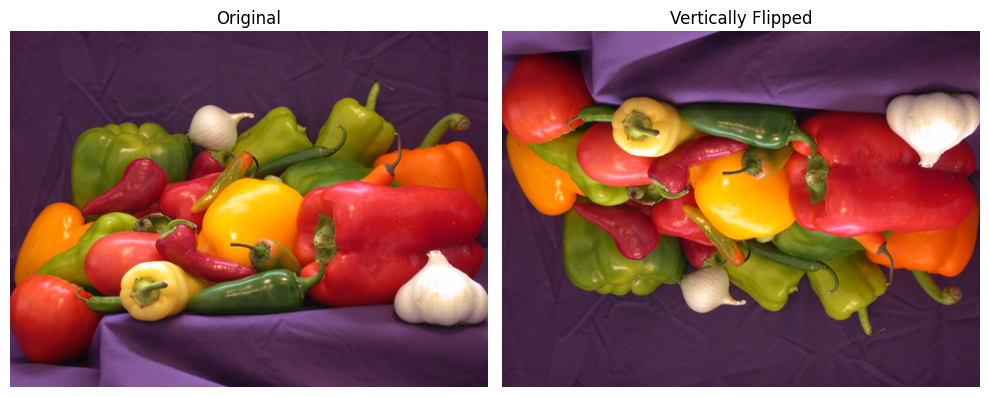

In [5]:
#Flip Vertical Image
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('peppers.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
horiz = cv2.flip(img, 0)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Original")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(horiz)
plt.title("Vertically Flipped")
plt.axis('off')

plt.tight_layout()
plt.show()

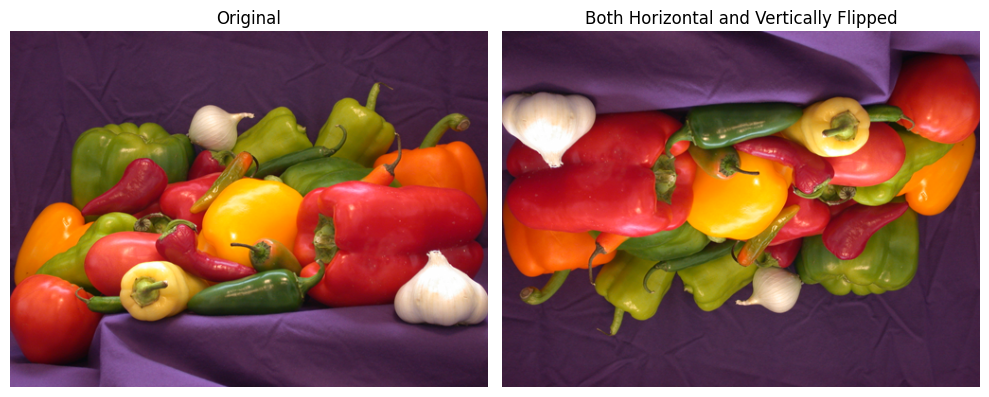

In [6]:
#Flip Both Horizontal and Vertical Image
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('peppers.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
horiz = cv2.flip(img, -1)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Original")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(horiz)
plt.title("Both Horizontal and Vertically Flipped")
plt.axis('off')

plt.tight_layout()
plt.show()

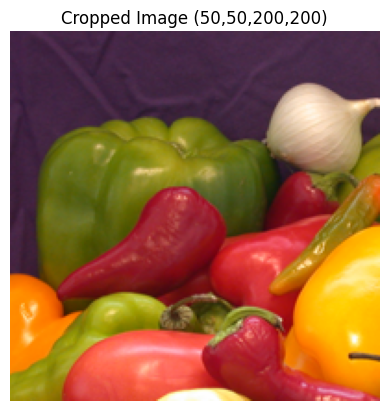

In [7]:
# Crop: (y:y+height, x:x+width)
crop = img[50:50+200, 50:50+200]

# Show cropped image
plt.imshow(crop)
plt.title("Cropped Image (50,50,200,200)")
plt.axis('off')
plt.show()


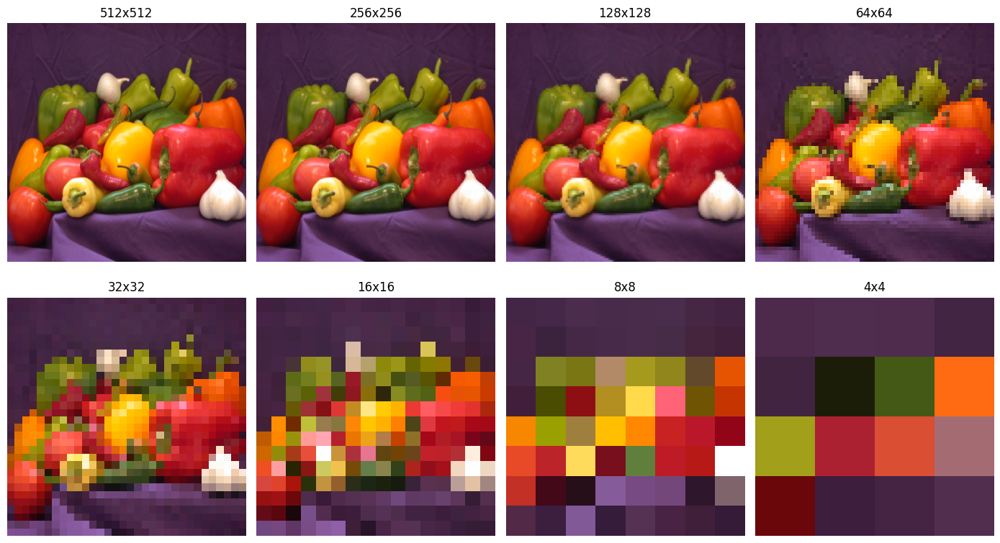

In [8]:
# Resize image based on sizes
sizes = [512, 256, 128, 64, 32, 16, 8, 4]
resized_images = [cv2.resize(img, (s, s), interpolation=cv2.INTER_LINEAR) for s in sizes]

# Display all resized versions
plt.figure(figsize=(14, 8))
for i, (resized, size) in enumerate(zip(resized_images, sizes)):
    plt.subplot(2, 4, i+1)
    plt.imshow(resized)
    plt.title(f'{size}x{size}')
    plt.axis('off')

plt.tight_layout()
plt.show()


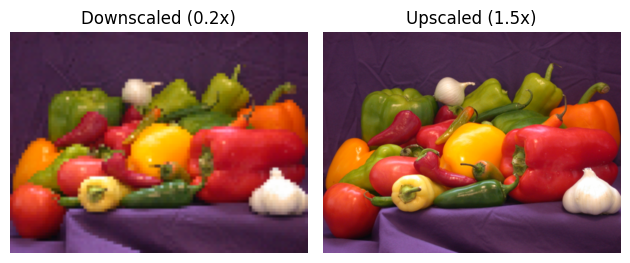

In [9]:
#Resize images based on scale

small = cv2.resize(img, None, fx=0.2, fy=0.2)  # Downscale
large = cv2.resize(img, None, fx=1.5, fy=1.5)  # Upscale

plt.subplot(1, 2, 1)
plt.imshow(small)
plt.title('Downscaled (0.2x)')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(large)
plt.title('Upscaled (1.5x)')
plt.axis('off')

plt.tight_layout()
plt.show()


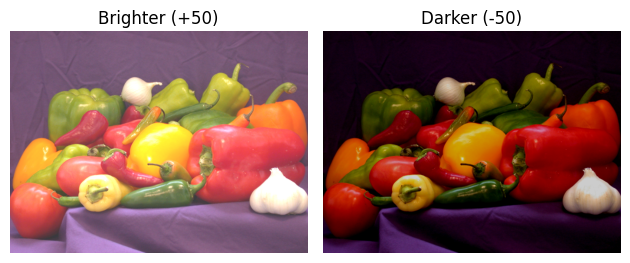

In [10]:
# Brightness Adjustment

brighter = np.clip(img.astype(np.int16) + 50, 0, 255).astype(np.uint8)
darker = np.clip(img.astype(np.int16) - 50, 0, 255).astype(np.uint8)

# Display
plt.subplot(1, 2, 1)
plt.imshow(brighter)
plt.title('Brighter (+50)')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(darker)
plt.title('Darker (-50)')
plt.axis('off')

plt.tight_layout()
plt.show()



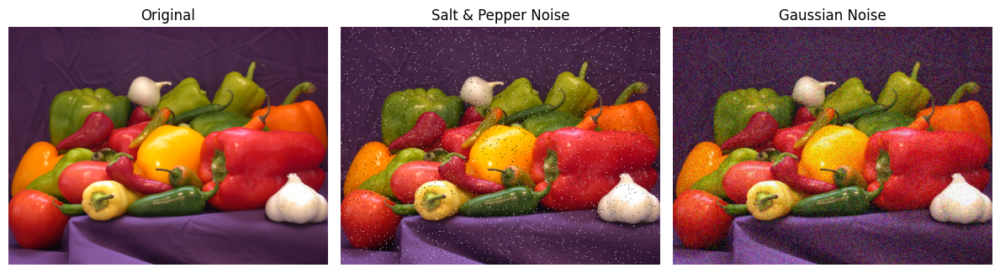

In [11]:
# Noise
# ---------- Noise Functions ----------

def add_salt_pepper_noise(image, amount=0.1):
    noisy = image.copy()
    h, w, _ = noisy.shape
    num_salt = int(amount * h * w / 2)
    num_pepper = int(amount * h * w / 2)

    coords_salt = [np.random.randint(0, i - 1, num_salt) for i in (h, w)]
    noisy[coords_salt[0], coords_salt[1]] = [255, 255, 255]

    coords_pepper = [np.random.randint(0, i - 1, num_pepper) for i in (h, w)]
    noisy[coords_pepper[0], coords_pepper[1]] = [0, 0, 0]

    return noisy

def add_gaussian_noise(image, mean=0, var=0.01):
    image = image / 255.0
    noise = np.random.normal(mean, var ** 0.5, image.shape)
    noisy = image + noise
    noisy = np.clip(noisy, 0, 1)
    return (noisy * 255).astype(np.uint8)

# ---------- Generate Noisy Images ----------
sp_noisy = add_salt_pepper_noise(img, amount=0.02)
gauss_noisy = add_gaussian_noise(img, mean=0, var=0.01)

# ---------- Display ----------
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(sp_noisy)
plt.title('Salt & Pepper Noise')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(gauss_noisy)
plt.title('Gaussian Noise')
plt.axis('off')

plt.tight_layout()
plt.show()


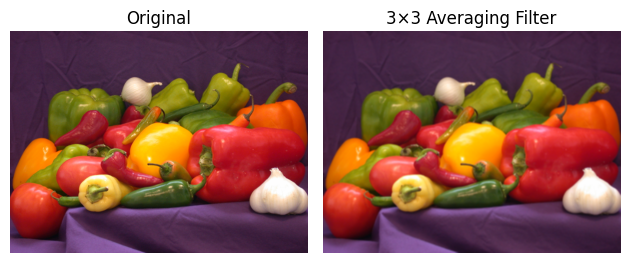

In [25]:
# Average smoothing filter

# Define 3×3 averaging kernel
kernel = np.ones((3, 3), dtype=np.float32) / 9.0

# Apply filter
smooth_filtered = cv2.filter2D(img, -1, kernel)

# Display original and filtered
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(smooth_filtered)
plt.title('3×3 Averaging Filter')
plt.axis('off')

plt.tight_layout()
plt.show()


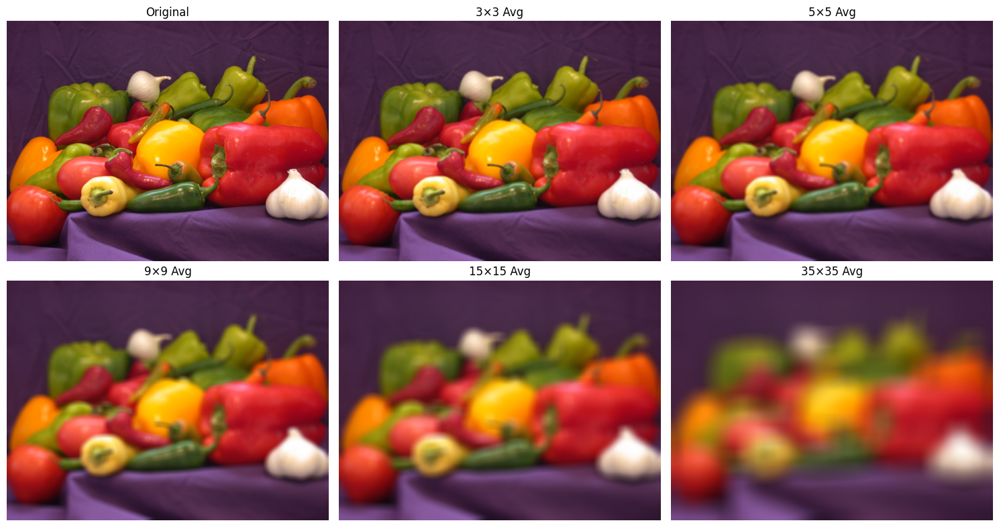

In [14]:
# ---------- Filter sizes (square kernels) ----------
sizes = [3, 5, 9, 15, 35]

# ---------- Apply each averaging filter ----------
filtered_imgs = []
for k in sizes:
    kernel = np.ones((k, k), dtype=np.float32) / (k * k)  # 1/(k²) everywhere
    filtered = cv2.filter2D(img, -1, kernel)
    filtered_imgs.append(filtered)

# ---------- Display ----------
plt.figure(figsize=(15, 8))

# Original
plt.subplot(2, 3, 1)
plt.imshow(img)
plt.title('Original')
plt.axis('off')

# Filtered versions
for i, (fimg, k) in enumerate(zip(filtered_imgs, sizes), start=2):
    plt.subplot(2, 3, i)
    plt.imshow(fimg)
    plt.title(f'{k}×{k} Avg')
    plt.axis('off')

plt.tight_layout()
plt.show()


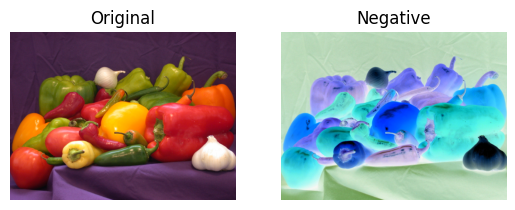

In [15]:
# Image negative
# Compute negative using s = L - 1 - r
negative_img = 255 - img

# Show the original and negative image
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Negative")
plt.imshow(negative_img, cmap='gray')
plt.axis('off')

plt.show()


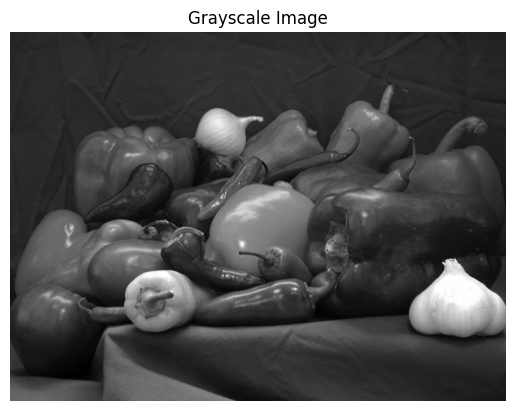

In [16]:
# Convert to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Show grayscale image
plt.imshow(gray_img, cmap='gray')
plt.title("Grayscale Image")
plt.axis('off')
plt.show()


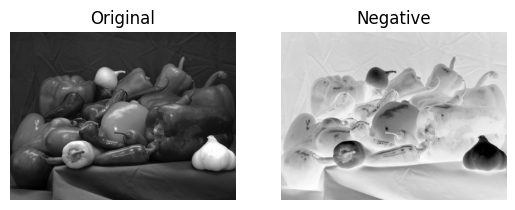

In [17]:
# Image negative of grayscale
# Compute negative using s = L - 1 - r
negative_img = 255 - gray_img

# Show the original and negative image
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(gray_img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Negative")
plt.imshow(negative_img, cmap='gray')
plt.axis('off')

plt.show()

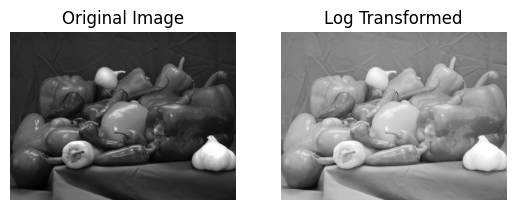

In [18]:
# Convert to float32 to avoid log(0) and overflow
img_float = gray_img.astype(np.float32)

# Apply log transform
c = 255 / np.log(1 + np.max(img_float))
log_transformed = c * np.log(1 + img_float)

# Convert back to 8-bit unsigned int
log_transformed = np.uint8(log_transformed)

# Display original and transformed image
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(gray_img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Log Transformed")
plt.imshow(log_transformed, cmap='gray')
plt.axis('off')

plt.show()


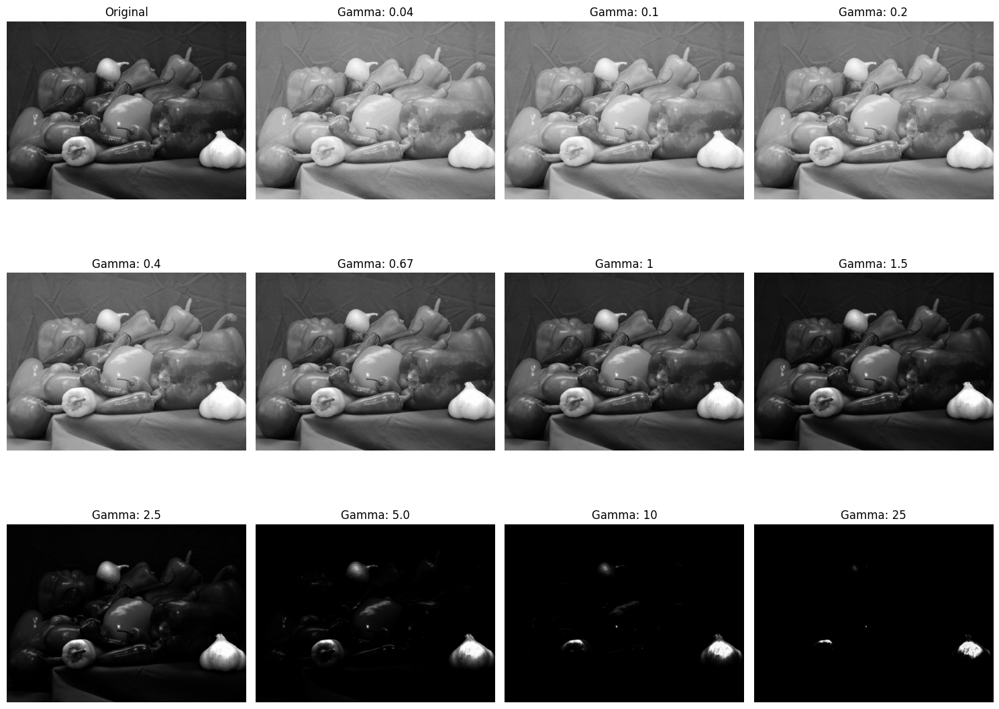

In [19]:

# Normalize the image to range [0,1]
img_normalized = gray_img / 255.0

# List of gamma values to try
gamma_values = [0.04, 0.1, 0.2, 0.4, 0.67, 1, 1.5, 2.5, 5.0, 10, 25]

# Plot results
plt.figure(figsize=(15, 12))
plt.subplot(3, 4, 1)
plt.imshow(gray_img, cmap='gray')
plt.title("Original")
plt.axis('off')

# Apply gamma transformation
for i, gamma in enumerate(gamma_values):
    gamma_corrected = np.power(img_normalized, gamma)
    output = np.uint8(gamma_corrected * 255)

    plt.subplot(3, 4, i + 2)
    plt.imshow(output, cmap='gray')
    plt.title(f'Gamma: {gamma}')
    plt.axis('off')

plt.tight_layout()
plt.show()


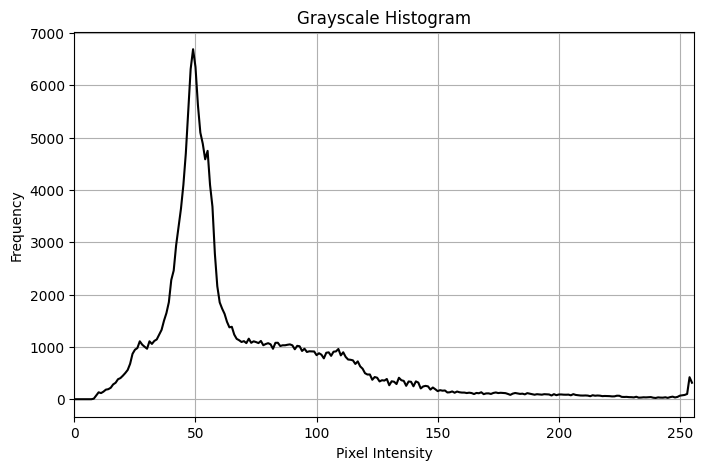

In [20]:
# Compute the histogram using OpenCV
hist = cv2.calcHist([gray_img], [0], None, [256], [0, 256])

# Plot the histogram
plt.figure(figsize=(8, 5))
plt.title("Grayscale Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.plot(hist, color='black')
plt.xlim([0, 256])
plt.grid(True)
plt.show()


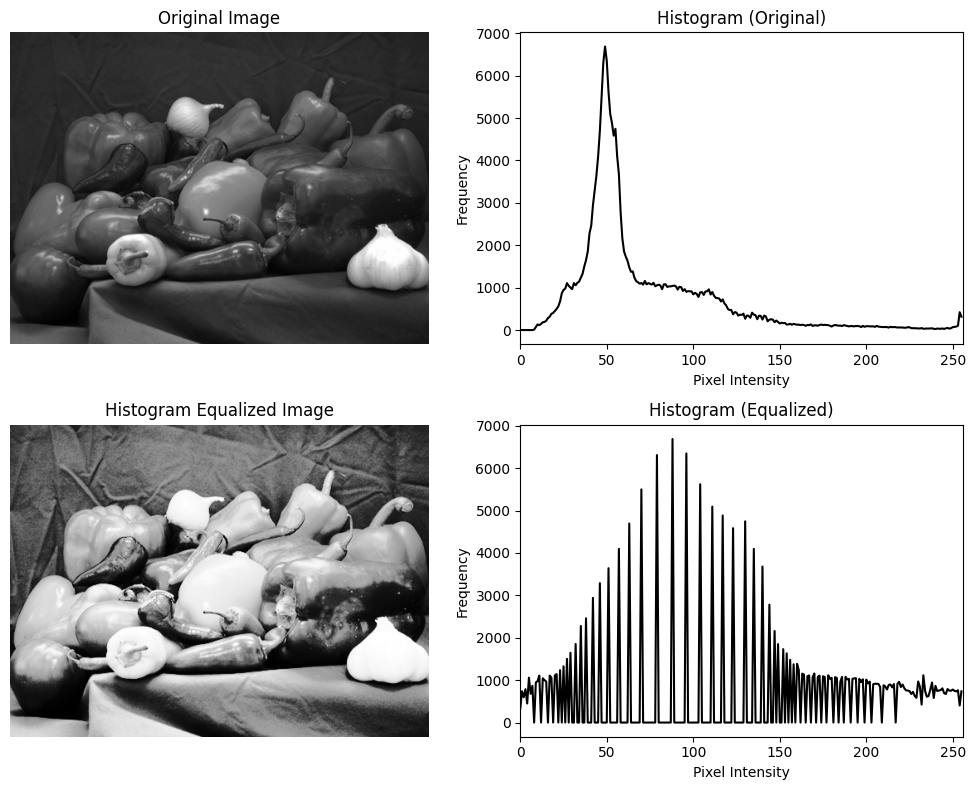

In [21]:

# Apply histogram equalization
equalized_img = cv2.equalizeHist(gray_img)

# Compute histograms
hist_original = cv2.calcHist([gray_img], [0], None, [256], [0, 256])
hist_equalized = cv2.calcHist([equalized_img], [0], None, [256], [0, 256])

# Plotting
plt.figure(figsize=(10, 8))

# 1. Original image
plt.subplot(2, 2, 1)
plt.imshow(gray_img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# 2. Histogram of original
plt.subplot(2, 2, 2)
plt.plot(hist_original, color='black')
plt.title('Histogram (Original)')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])

# 3. Equalized image
plt.subplot(2, 2, 3)
plt.imshow(equalized_img, cmap='gray')
plt.title('Histogram Equalized Image')
plt.axis('off')

# 4. Histogram of equalized image
plt.subplot(2, 2, 4)
plt.plot(hist_equalized, color='black')
plt.title('Histogram (Equalized)')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])

plt.tight_layout()
plt.show()


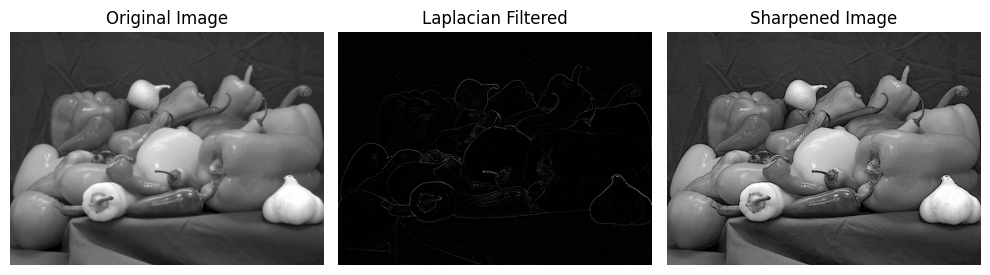

In [28]:
#Image sharpening with laplacian filter

# Read image in grayscale
img = cv2.imread('/content/peppers.png', cv2.IMREAD_GRAYSCALE)

# Define Laplacian kernel
laplacian_kernel = np.array([[0,  1,  0],
                             [1, -4,  1],
                             [0,  1,  0]])

# Apply the Laplacian filter
laplacian_filtered = cv2.filter2D(img, ddepth=cv2.CV_64F, kernel=laplacian_kernel)

# Convert back to uint8 (scale and clip to valid range)
laplacian_filtered = np.uint8(np.clip(laplacian_filtered, 0, 255))

# Sharpened image = original - Laplacian
sharpened_img = cv2.subtract(img, laplacian_filtered)

# Plotting
plt.figure(figsize=(10, 6))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Laplacian Filtered')
plt.imshow(laplacian_filtered, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Sharpened Image')
plt.imshow(sharpened_img, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


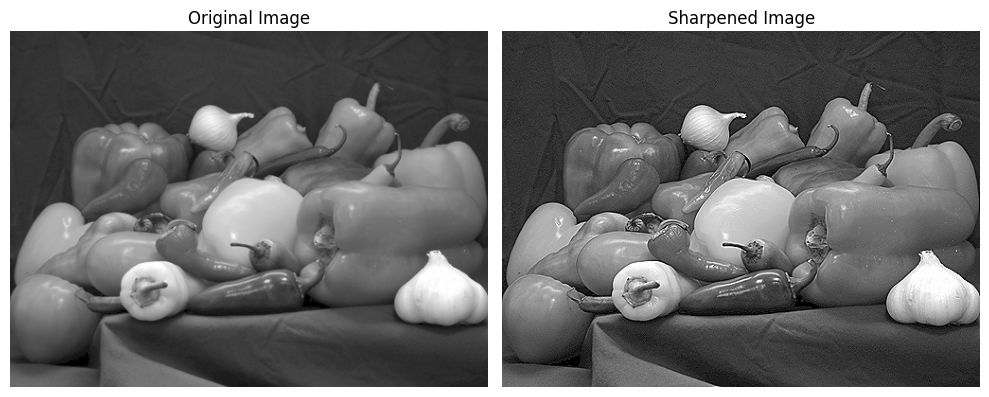

In [27]:
#Image sharpening without subtraction

# Read the image in grayscale
img = cv2.imread('/content/peppers.png', cv2.IMREAD_GRAYSCALE)

# Define sharpening kernel
sharpen_kernel = np.array([[ 0, -1,  0],
                           [-1,  5, -1],
                           [ 0, -1,  0]])

# Apply the sharpening kernel directly
sharpened_img = cv2.filter2D(img, ddepth=-1, kernel=sharpen_kernel)

# Plot the results
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Sharpened Image")
plt.imshow(sharpened_img, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


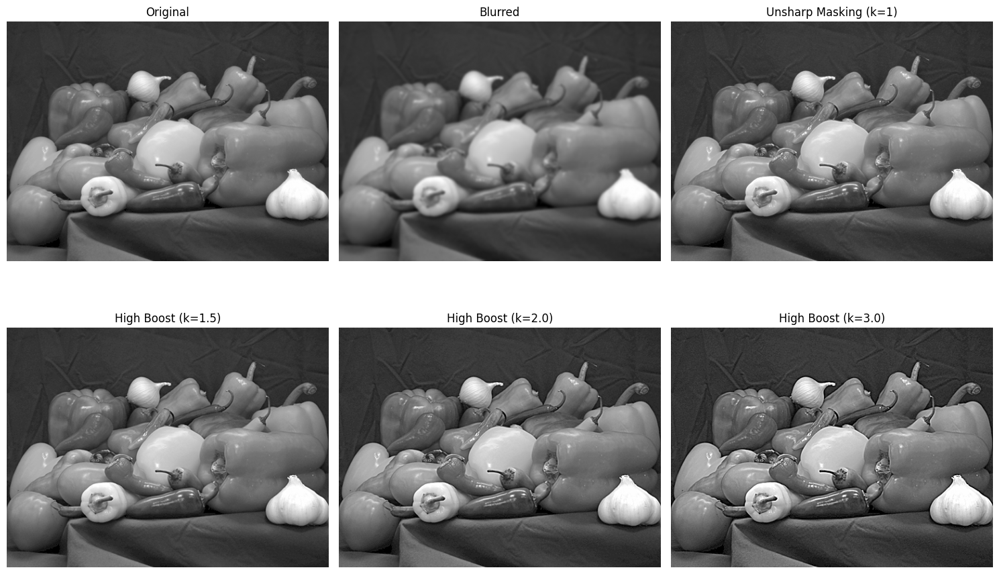

In [31]:
#Unsharp masking and highboost filtering

# Read the image in grayscale
img = cv2.imread('/content/peppers.png', cv2.IMREAD_GRAYSCALE)

# Apply Gaussian blur
blur = cv2.GaussianBlur(img, (7, 7), sigmaX=0)

# Compute the mask
mask = cv2.subtract(img, blur)

# Unsharp Masking (k = 1)
unsharp = cv2.add(img, mask)

# High-Boost Filtering with A = 1.5, 2.0, 3.0
high_boost_1_5 = cv2.addWeighted(img, 1.5, blur, -0.5, 0)
high_boost_2_0 = cv2.addWeighted(img, 2.0, blur, -1.0, 0)
high_boost_3_0 = cv2.addWeighted(img, 3.0, blur, -2.0, 0)

# Display results
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(img, cmap='gray')
plt.title("Original")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(blur, cmap='gray')
plt.title("Blurred")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(unsharp, cmap='gray')
plt.title("Unsharp Masking (k=1)")
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(high_boost_1_5, cmap='gray')
plt.title("High Boost (k=1.5)")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(high_boost_2_0, cmap='gray')
plt.title("High Boost (k=2.0)")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(high_boost_3_0, cmap='gray')
plt.title("High Boost (k=3.0)")
plt.axis('off')

plt.tight_layout()
plt.show()
